In [40]:
from pathlib import Path
from glob import glob

import cartopy.crs as ccrs
import iris
from IPython.display import HTML, clear_output
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import matplotlib.colors as mcolors
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import xarray as xr
import xesmf as xe

from mcs_prime import mcs_prime_config_util as cu

In [4]:
datadir = cu.PATHS['datadir']
simdir = datadir / 'UM_sims'

In [18]:
ens = {
    'ctrl': {},
    'sMCSP': {},
}

for i in range(8):
    print('ctrl', i)
    dsa = xr.open_dataset(simdir / f'zhixiao_mirror/pa_um_off/englaa_pa000_em{i}.iris.nc')
    pflux = dsa.precipitation_flux
    pflux0 = dsa.precipitation_flux_0
    pflux = pflux.rename(time_0='time')
    pflux0 = pflux0.rename(time_1='time')
    pflux_tropics = pflux.isel(latitude=slice(108, 216), time=slice(0, 20))
    # convert from kg m-2 s-1 to mm h-1
    pflux_tropics.values = pflux_tropics.values * 3600
    pflux_tropics.attrs['units'] = 'mm h-1'
    ens['ctrl'][f'em{i}'] = pflux_tropics

for i in range(8):
    print('sMCSP', i)
    dsa = xr.open_dataset(simdir / f'u-dg135/share/cycle/20200701T0000Z/engl/um/em{i}/englaa_pa000.iris.nc')
    pflux = dsa.precipitation_flux
    pflux0 = dsa.precipitation_flux_0
    pflux = pflux.rename(time_0='time')
    pflux0 = pflux0.rename(time_1='time')
    pflux_tropics = pflux.isel(latitude=slice(108, 216), time=slice(0, 20))
    # convert from kg m-2 s-1 to mm h-1    
    pflux_tropics.values = pflux_tropics.values * 3600
    pflux_tropics.attrs['units'] = 'mm h-1'    
    ens['sMCSP'][f'em{i}'] = pflux_tropics
    


ctrl 0
ctrl 1
ctrl 2
ctrl 3
ctrl 4
ctrl 5
ctrl 6
ctrl 7
sMCSP 0
sMCSP 1
sMCSP 2
sMCSP 3
sMCSP 4
sMCSP 5
sMCSP 6
sMCSP 7


In [19]:
ens['ctrl']['em0']

<xarray.DataArray 'precipitation_flux' (time: 20, latitude: 108, longitude: 432)>
array([[[3.10103991e-02, 2.14695389e-04, 1.22083575e-02, ...,
         1.85788392e-02, 4.82072473e-05, 5.68055689e-04],
        [1.66809302e-04, 2.93388846e-03, 3.89944087e-03, ...,
         1.82830345e-02, 2.30395941e-02, 2.68448140e-02],
        [3.95842216e-05, 2.13638757e-02, 3.24425013e-05, ...,
         1.30119384e-02, 1.95822544e-02, 5.31025716e-05],
        ...,
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00]],

       [[3.77704677e-02, 7.14298084e-04, 8.10317786e-03, ...,
         4.39509265e-02, 6.38197332e-03, 1.29948514e-07],
        [1.80284570e-02, 9.69067834e-03, 3.90137317e-03, ...,
         1.57634749e-02, 2.77027059e-04, 3.56630320e-02],
        [2.14507775e-03, 1.54258367e-02, 5.21816666e-06, ...,
         1.23750508e-02, 1.81899499e-02, 9.26499892e-05],
...
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         0.00000000e+00, 8.29036447e-04, 0.00000000e+00],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         1.30048268e-05, 1.45281312e-04, 5.20470517e-05],
        [0.00000000e+00, 0.00000000e+00, 2.53907994e-02, ...,
         1.12299995e-05, 0.00000000e+00, 0.00000000e+00]],

       [[2.13515244e-03, 1.13292185e-05, 1.38713308e-02, ...,
         4.53037970e-01, 3.33420468e-01, 3.59614100e-01],
        [2.13187523e-02, 1.42206759e-02, 1.29491567e-03, ...,
         5.14734048e-03, 5.07630349e-03, 8.87698901e-05],
        [2.36918508e-05, 4.55182702e-04, 2.60290055e-02, ...,
         3.29453773e-04, 0.00000000e+00, 0.00000000e+00],
        ...,
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         0.00000000e+00, 3.15363654e-04, 0.00000000e+00],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         1.41832656e-06, 5.11607154e-03, 0.00000000e+00],
        [0.00000000e+00, 0.00000000e+00, 2.26102188e-02, ...,
         5.97365404e-05, 0.00000000e+00, 0.00000000e+00]]])
Coordinates:
  * latitude                   (latitude) float32 -29.72 -29.17 ... 29.17 29.72
  * longitude                  (longitude) float32 0.4167 1.25 ... 358.7 359.6
  * time                       (time) datetime64[ns] 2020-07-01T04:00:00 ... ...
    forecast_period_0          (time) timedelta64[ns] ...
    forecast_reference_time_0  (time) datetime64[ns] ...
    height                     float64 ...
    forecast_period_2          timedelta64[ns] ...
    forecast_reference_time_1  datetime64[ns] ...
    time_2                     datetime64[ns] ...
    height_0                   float64 ...
    height_1                   float64 ...
Attributes:
    standard_name:    precipitation_flux
    units:            mm h-1
    um_stash_source:  m01s05i216
    grid_mapping:     latitude_longitude

In [20]:
ens['sMCSP']['em0']

<xarray.DataArray 'precipitation_flux' (time: 20, latitude: 108, longitude: 432)>
array([[[3.10347229e-02, 2.13586318e-04, 1.22173224e-02, ...,
         1.86480954e-02, 4.69473453e-05, 5.64585207e-04],
        [1.66788421e-04, 2.93383864e-03, 3.89932445e-03, ...,
         1.82400495e-02, 2.29946841e-02, 2.68470868e-02],
        [3.95789066e-05, 2.13651825e-02, 3.24362190e-05, ...,
         1.30096423e-02, 1.95825621e-02, 5.30960315e-05],
        ...,
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00]],

       [[3.78043726e-02, 7.13731104e-04, 8.08951259e-03, ...,
         4.12915759e-02, 5.87672321e-03, 1.28644459e-07],
        [1.80263184e-02, 1.04188612e-02, 3.89787555e-03, ...,
         1.58227421e-02, 2.73720012e-04, 3.56618538e-02],
        [2.14369711e-03, 1.54342987e-02, 5.21863831e-06, ...,
         1.23944525e-02, 1.82173867e-02, 9.28538866e-05],
...
        [0.00000000e+00, 0.00000000e+00, 4.05996107e-03, ...,
         0.00000000e+00, 0.00000000e+00, 6.04625984e-06],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         0.00000000e+00, 0.00000000e+00, 6.46416593e-05],
        [0.00000000e+00, 0.00000000e+00, 9.05096997e-03, ...,
         8.40604025e-06, 0.00000000e+00, 0.00000000e+00]],

       [[4.12880880e-04, 4.37611103e-04, 1.29795633e-02, ...,
         2.73091823e-01, 3.11845064e-01, 3.14270705e-02],
        [1.52559113e-03, 1.78193171e-02, 1.64991434e-04, ...,
         2.43511423e-01, 1.92906344e-04, 6.80500216e-06],
        [2.73780141e-04, 1.63970817e-05, 1.15156046e-03, ...,
         3.56674776e-03, 1.24297244e-03, 2.35654385e-04],
        ...,
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         0.00000000e+00, 0.00000000e+00, 1.08368304e-05],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         2.23607603e-05, 0.00000000e+00, 0.00000000e+00]]], dtype=float32)
Coordinates:
  * latitude                   (latitude) float32 -29.72 -29.17 ... 29.17 29.72
  * longitude                  (longitude) float32 0.4167 1.25 ... 358.7 359.6
  * time                       (time) datetime64[ns] 2020-07-01T04:00:00 ... ...
    forecast_period_0          (time) timedelta64[ns] ...
    forecast_reference_time_0  (time) datetime64[ns] ...
    height                     float64 ...
    forecast_period_2          timedelta64[ns] ...
    forecast_reference_time_1  datetime64[ns] ...
    time_2                     datetime64[ns] ...
    height_0                   float32 ...
    height_1                   float64 ...
Attributes:
    standard_name:    precipitation_flux
    units:            mm h-1
    um_stash_source:  m01s05i216
    grid_mapping:     latitude_longitude

In [27]:
def calc_lon_lst0_lst12(h):
    lon_lst0 = -h * 15
    lon_lst12 = -(h - 12) * 15

    lon_lst0 = (lon_lst0 + 180) % 360 - 180
    lon_lst12 = (lon_lst12 + 180) % 360 - 180
    return lon_lst0, lon_lst12

In [21]:
%%capture
# %%script false --no-raise-error

# Set up the figure, the axis, and the plot element we want to animate
fig, axes = plt.subplots(2, 1, subplot_kw={'projection': ccrs.PlateCarree()}, layout='constrained')
fig.set_size_inches(15, 5)
axes[0].set_ylim((-30, 30))
axes[1].set_ylim((-30, 30))

# colors = ['#800080', '#0000FF', '#6495ED', '#7FFFD4', '#66CDAA', '#32CD32', '#ADFF2F', '#FFFF99', '#FFD700', '#FFA500', '#FF4500', '#800080']
colors = ['#FFFFFF', '#0000FF', '#6495ED', '#7FFFD4', '#66CDAA', '#32CD32', '#ADFF2F', '#FFFF99', '#FFD700', '#FFA500', '#FF4500', '#800080']
# Create a custom colormap
cmap = mcolors.ListedColormap(colors)
im = axes[0].contourf(pflux.longitude, pflux.latitude, pflux[0] * 3600, levels=np.arange(13), cmap=cmap)
plt.colorbar(im, ax=axes, label='precip. (mm h$^{-1}$)') 

In [29]:
#%%script false --no-raise-error
# pmax = max(pflux.values.max(), pflux0.values.max())
fig.set_constrained_layout(False)

# Update function for the animation
def plot_ctrl_sMCSP(frame):
    print(frame)
    for ax in axes:
        ax.cla()
        ax.coastlines()
    pflux1 = ens['ctrl']['em0']
    pflux2 = ens['sMCSP']['em0']
    axes[0].contourf(pflux1.longitude, pflux1.latitude, pflux1[frame], levels=np.arange(13), cmap=cmap)
    axes[1].contourf(pflux2.longitude, pflux2.latitude, pflux2[frame], levels=np.arange(13), cmap=cmap)
    time = pd.Timestamp(pflux.time[frame].values.item())
    axes[0].set_title(f'N216 ctrl em0: {time}')
    axes[1].set_title(f'N216 sMCSP em0: {time}')
    lst0, lst12 = calc_lon_lst0_lst12(time.hour)
    for ax in axes:
        ax.axvline(x=lst0, c='k')
        ax.axvline(x=lst12, c='orange')
        ax.text(x=lst0, y=-100, s='0000 LST', ha='center')
        ax.text(x=lst12, y=-100, s='1200 LST', ha='center', c='orange')

# Create the animation object
ani = FuncAnimation(fig, plot_ctrl_sMCSP, frames=range(20))

clear_output()
# Display the animation in the notebook
jshtml = ani.to_jshtml()
clear_output()
HTML(jshtml)


In [34]:


DATADIR = cu.PATHS['datadir']
IMERG_FINAL_30MIN_DIR = DATADIR / 'GPM_IMERG_final/30min'
# Just load IMERG on the hour "S??0000".
paths = sorted(glob(str(IMERG_FINAL_30MIN_DIR / '2020/07/01/*-S??0000-*.nc4')))

In [35]:
ds_imerg = xr.open_mfdataset(paths)

In [36]:
ds_imerg

<xarray.Dataset>
Dimensions:        (time: 24, lon: 3600, lat: 1800)
Coordinates:
  * lat            (lat) float32 -89.95 -89.85 -89.75 ... 89.75 89.85 89.95
  * lon            (lon) float32 -179.9 -179.9 -179.8 ... 179.8 179.8 179.9
  * time           (time) object 2020-07-01 00:00:00 ... 2020-07-01 23:00:00
Data variables:
    precipitation  (time, lon, lat) float32 dask.array<chunksize=(1, 3600, 1800), meta=np.ndarray>
Attributes:
    FileHeader:                      DOI=10.5067/GPM/IMERG/3B-HH/07;\nDOIauth...
    FileInfo:                        DataFormatVersion=7e;\nTKCodeBuildVersio...
    Grid.GridHeader:                 BinMethod=ARITHMETIC_MEAN;\nRegistration...
    Grid.fullnamepath:               /Grid
    DODS_EXTRA.Unlimited_Dimension:  time
    history:                         2024-06-06 14:57:30 GMT Hyrax-1.16.3 htt...

In [37]:
imerg_precip = ds_imerg.precipitation

In [38]:
imerg_precip.attrs

{'DimensionNames': 'time,lon,lat',
 'Units': 'mm/hr',
 'units': 'mm/hr',
 'CodeMissingValue': '-9999.9',
 'LongName': '\nComplete merged microwave-infrared (gauge-adjusted)\n                        precipitation estimate;  formerly precipitationCal\n',
 'origname': 'precipitation',
 'fullnamepath': '/Grid/precipitation',
 'coordinates': 'Grid_time Grid_lon Grid_lat'}

In [41]:
# Regrid OBS
# pflux.cf has no bounds, meaning conservative regridding won't work for now
# Perform conservative regridding
# regridder = xe.Regridder(gpcp.satellite_precip, pflux, method='conservative')
regridder = xe.Regridder(imerg_precip, pflux, method='bilinear')
regridded_imerg = regridder(imerg_precip)

/home/users/mmuetz/miniconda3/envs/mcs_prime_env/lib/python3.10/site-packages/dask/array/core.py:456: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  o = func(*args, **kwargs)
/home/users/mmuetz/miniconda3/envs/mcs_prime_env/lib/python3.10/site-packages/xarray/core/dataarray.py:780: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  return key in self.data
/home/users/mmuetz/miniconda3/envs/mcs_prime_env/lib/python3.10/site-packages/xarray/core/dataarray.py:780: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  return key in self.data


In [42]:
imerg = regridded_imerg.isel(latitude=slice(108, 216), time=slice(4, 24))

In [51]:
%%capture
# %%script false --no-raise-error

# Set up the figure, the axis, and the plot element we want to animate
fig, axes = plt.subplots(3, 1, subplot_kw={'projection': ccrs.PlateCarree()}, layout='constrained')
fig.set_size_inches(15, 6.5)
# Update function for the animation
def plot_ctrl_sMCSP_imerg(frame):
    print(frame)
    for ax in axes:
        ax.cla()
        ax.coastlines()
        ax.set_ylim((-30, 30))

    pflux1 = ens['ctrl']['em0']
    pflux2 = ens['sMCSP']['em0']
    axes[0].contourf(imerg.longitude, imerg.latitude, imerg[frame], levels=np.arange(13), cmap=cmap)
    axes[1].contourf(pflux1.longitude, pflux1.latitude, pflux1[frame], levels=np.arange(13), cmap=cmap)
    im = axes[2].contourf(pflux2.longitude, pflux2.latitude, pflux2[frame], levels=np.arange(13), cmap=cmap)
    time = pd.Timestamp(pflux.time[frame].values.item())
    axes[0].set_title(f'IMERG: {time}')
    axes[1].set_title(f'N216 ctrl em0: {time}')
    axes[2].set_title(f'N216 sMCSP em0: {time}')
    lst0, lst12 = calc_lon_lst0_lst12(time.hour)
    for ax in axes:
        ax.axvline(x=lst0, c='k')
        ax.axvline(x=lst12, c='orange')
        ax.text(x=lst0, y=-100, s='0000 LST', ha='center')
        ax.text(x=lst12, y=-100, s='1200 LST', ha='center', c='orange')
    return im

im = plot_ctrl_sMCSP_imerg(0)
plt.colorbar(im, ax=axes, label='precip. (mm h$^{-1}$)') 

In [53]:
fig.set_constrained_layout(False)

# Create the animation object
ani = FuncAnimation(fig, plot_ctrl_sMCSP_imerg, frames=range(20))
jshtml = ani.to_jshtml()
clear_output()
# Display the animation in the notebook
HTML(jshtml)

In [57]:
class EnsStatsCalculator:
    def demo(self):
        """Use this to understand algorithm"""
        a = np.array([
            [0, 0, 0, 1, 1, 1],
            [0, 0, 0, 0, 0, 1],
            [1, 0, 0, 0, 1, 1],
            [0, 1, 0, 0, 0, 0],
            [1, 0, 1, 0, 0, 0],
        ])
        max_w = 1
        max_n = 3
        print('a =')
        print(a)

        aa = self.zero_pad_array(a, max_w, max_n)
        print('aa =')
        print(aa)
        cuma = self.calc_cumulative_array(aa)
        print('cuma =')
        print(cuma)
        # Actual code loops over w values, with smart slicing of cuma.
        totals = self.calc_totals_array(cuma, max_n)
        print('totals =')
        print(totals)
                                 
        
    def zero_pad_array(self, a, max_w, max_n):
        """Build a new shape, sufficiently expanded so that it can handle the max neighbourhood size."""
        new_shape1 = tuple([*a.shape[:-2]] + [a.shape[-2] + max_n] + [a.shape[-1] + max_n])
        aa = np.zeros(new_shape1, dtype=a.dtype)
        # Copy input array into an expanded array. Presever all dims apart from last two.
        aa[..., max_n - max_w:-max_w, max_n - max_w:-max_w] = a
        return aa

    def calc_cumulative_array(self, aa):
        """Calculate a cumulative sum in both of last two dims."""
        return np.cumsum(np.cumsum(aa, axis=-1), axis=-2)
    
    def calc_totals_array(self, cuma, n):
        """Calculate the totals for one neighbourhood distance"""
        return cuma[..., n:, n:] - cuma[..., :-n, n:] - (cuma[..., n:, :-n] - cuma[..., :-n, :-n])

    def calc_totals_in_neighbourhoods(self, a, max_w):
        """Calculate the totals for all neighbourhoods from w=1 to max_w.
        
        Inputs:
        a: np.array, with final two dimensions the spatial dimensions.
        max_w: maximum neighbourhood size.
        Returns:
        totals: np.array, with same shape as a but extra dimension for w.
        
        Equivalent to stat.tot_filter in Seonaid's code.

        The algorithm for this is:
        * expand (zero pad) initial array so that I can do entire calc using slices.
        * calc a cumulitive array, cuma, that can be quickly used to calculate the number of 
          values in any given neihbourhood using four values.
        * loop over neighbourhood sizes:
          - from cuma, sliced appropriately, perform efficient calc of how many values are 
            in any given neighbourhood by calling calc_totals_array.

        What does this look like?
        Start with array:

        a = np.array([
            [0, 0, 0, 1, 1, 1],
            [0, 0, 0, 0, 0, 1],
            [1, 0, 0, 0, 1, 1],
            [0, 1, 0, 0, 0, 0],
            [1, 0, 1, 0, 0, 0],
        ])
        max_w = 1
        max_n = 3
        new_shape = (5 + 3, 6 + 3)
        aa = np.array([
            [0, 0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 1, 1, 1, 0],
            [0, 0, 0, 0, 0, 0, 0, 1, 0],
            [0, 0, 1, 0, 0, 0, 1, 1, 0],
            [0, 0, 0, 1, 0, 0, 0, 0, 0],
            [0, 0, 1, 0, 1, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 0, 0, 0, 0],
        ])
        cuma = np.array([
            [0, 0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 1, 2, 3, 3],
            [0, 0, 0, 0, 0, 1, 2, 4, 4],
            [0, 0, 1, 1, 1, 2, 4, 7, 7],
            [0, 0, 1, 2, 2, 3, 5, 8, 8],
            [0, 0, 2, 3, 4, 5, 7, 10, 10],
            [0, 0, 2, 3, 4, 5, 7, 10, 10],
        ])

        You can calculate the neighbourhood on any 3x3 sqaure in this as follows
        if the centre coord is i, j:
        v = (cuma[i + 1, j + 1] - cuma[i + 1, j - 2]) - (cuma[i - 2, j + 1] - cuma[i - 2, j - 2])
        You can convince yourself that this works by noting that the first bracketed term
        picks out a box that spans 3 columns, and contains the sum of the values in that area. Ditto the second
        bracketed term, but with 3 fewer rows. So subtracting the second from the first gives you the sum
        in the desired neighbourhood.
        """
        max_w = max_w
        max_n = max_w * 2 + 1
        aa = self.zero_pad_array(a, max_w, max_n)
        cuma = self.calc_cumulative_array(aa)

        ws = range(1, max_w + 1)
        new_shape2 = tuple([*a.shape, len(ws) + 1]) # +1 is for consistency with Seonaid, even though not used.
        totals = np.zeros(new_shape2)

        for i, w in enumerate(ws):
            n = w * 2 + 1
            margin = max_w - w
            if margin == 0:
                sliced_cuma = cuma
            else:
                sliced_cuma = cuma[..., margin:-margin, margin:-margin]
            totals[..., i] = self.calc_totals_array(sliced_cuma, n)
        return totals
    
    def calc_fracs_in_neighbourhoods(self, a, max_w):
        totals = self.calc_totals_in_neighbourhoods(a, max_w)
        ws = np.arange(1, max_w + 2)
        ns = 2 * ws + 1
        return totals / ws
    # Not using for now until I'm happy with what it's doing
    # def calc_dFSS_m2m(self, a, max_w, mode='fast'):
    #     """Calculate the dFSS (dispersion fractional skill score) model to model
        
    #     i.e. between ensemble pairs.
        
    #     Inputs:
    #     a: np.array(nmem, ntime, nx, ny)
    #     max_w: maximum scale to use
    #     mode: 'fast' or 'orig'. Give identical results.
        
    #     Return:
    #     np.array(nmem, nmem, nx, ny, ntime)
        
    #     Algorithm:
    #     * calc neighbourhood totals
    #     * loop over time
    #     * loop over ensemble pairs 
    #     * for ens pair, find the first scale (w) where relationship is exceeded
    #     * record on 2d grid
    #     """
    #     # Constants taken straight from Seonaid's code.
    #     alpha = 0.5
    #     beta = 1 - alpha
    #     ws = np.arange(1, max_w + 2)
    #     # See dey2014spatial, eqn 5.
    #     rhs = alpha + beta / max_w * ws
        
    #     # Hardcoded dims hard to avoid?
    #     dims = np.shape(a)
    #     nummem = dims[0]  # number of members
    #     ntime = dims[1]  # number of times
    #     nx = dims[2]  # number of x points
    #     ny = dims[3]  # number of y points
    #     ess = np.zeros((nummem, nummem, nx, ny, ntime)) 
        
    #     totals = self.calc_totals_in_neighbourhoods(a, max_w)
    #     for i_time in range(ntime):
    #         # print(i_time)
    #         for i_mem1 in range(nummem - 1):
    #             for i_mem2 in range(i_mem1, nummem):
    #                 d1 = totals[i_mem1, i_time, ...]
    #                 d2 = totals[i_mem2, i_time, ...]
    #                 with np.errstate(divide='ignore', invalid='ignore'):
    #                     # These are fixed in next line.
    #                     lhs = (d1 - d2)**2 / (d1**2 + d2**2)
    #                 lhs[(d1 <= 0) & (d2 <= 0)] = 10
    #                 if mode == 'fast':
    #                     # Avoids any slow python loops.
    #                     exceedance3d = lhs / rhs[None, None, :] < 1
    #                     # Trick to get first value along axis=-1 where condition is true.
    #                     # https://stackoverflow.com/a/54155879/54557
    #                     idx = np.where((exceedance3d.cumsum(axis=-1).cumsum(axis=-1) == 1))
    #                     # Build 2d array to store values
    #                     exceedance2d = np.zeros(exceedance3d.shape[:2])
    #                     # Use the first two pairs of values in idx[:2] to set array
    #                     # Set with third value in idx[2], which is the index of the first 
    #                     # exceedance cell.
    #                     exceedance2d[idx[:2]] = idx[2] + 1  # consistency with Seonaid's code
    #                     # Any zerod values should be set to max_w.
    #                     exceedance2d[exceedance2d == 0] = max_w
    #                     ess[i_mem1, i_mem2, :, :, i_time] = exceedance2d
    #                 elif mode == 'orig':
    #                     # As Seonaid's original code.
    #                     for i_x in range(0, nx, 1):  # loop over grid points
    #                         for i_y in range(0, ny, 1):  # find minimum scale at which criterion is met
    #                             w = 1
    #                             exceeded = 0
    #                             while exceeded == 0:
    #                                 if (
    #                                     lhs[i_x, i_y, w - 1] / rhs[w - 1] < 1
    #                                 ):  # THIS SHOULD BE A <= (THOUGH CHANGING THIS WON'T HAVE ANY NOTICIBLE EFFECT)
    #                                     ess[i_mem1, i_mem2, i_x, i_y, i_time] = w
    #                                     exceeded = 1
    #                                 elif (
    #                                     w >= max_w
    #                                 ):  # THIS IS ONLY NEEDED BECAUSE THE <= IS A < (LHS=RHS BY DEFINITION AT LMAX, SO IF USE <= DON'T NEED THIS STEP)
    #                                     exceeded = 1
    #                                     ess[i_mem1, i_mem2, i_x, i_y, i_time] = max_w
    #                                 else:
    #                                     w = w + 1
                             
    #     return ess
    
    def calc_FSS(self, a1, a2, max_w):
        max_n = max_w * 2 + 1
        f1 = self.calc_fracs_in_neighbourhoods(a1, max_w)
        f2 = self.calc_fracs_in_neighbourhoods(a2, max_w)
        return 1 - np.nansum(((f1 - f2)**2), axis=(1, 2)) / np.nansum((f1**2 + f2**2), axis=(1, 2))


calc = EnsStatsCalculator()

In [58]:
pflux = ens['ctrl']['em0']

In [60]:
pflux_ptile = np.percentile((pflux.values), 99)
imerg_ptile = np.percentile((imerg.values), 99)
print(pflux_ptile, imerg_ptile)
pflux_ptile = 2
imerg_ptile = 2
fss = calc.calc_FSS(pflux.values > pflux_ptile, imerg.values > imerg_ptile, 80)

2.784892437020825 3.258297367095935


/tmp/ipykernel_552/148060283.py:217: RuntimeWarning: invalid value encountered in true_divide
  return 1 - np.nansum(((f1 - f2)**2), axis=(1, 2)) / np.nansum((f1**2 + f2**2), axis=(1, 2))


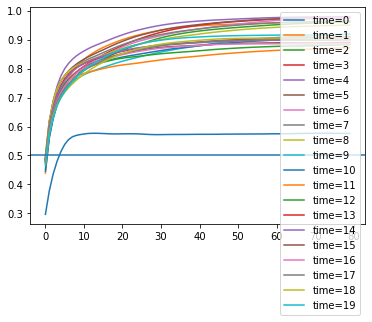

In [61]:
for itime in range(20):
    plt.plot(fss[itime], label=f'time={itime}')
plt.legend()
plt.axhline(y=0.5)

In [66]:
wmax = 40

In [67]:
expt_dFSS = {}
for expt in ['ctrl', 'sMCSP']:
    print(expt)
    dFSS = np.full((8, 8, 20, wmax), np.nan)
    expt_ens = ens[expt]
    for i in range(8):
        for j in range(i + 1, 8):
            print(i, j)
            pflux1 = expt_ens[f'em{i}']
            pflux2 = expt_ens[f'em{j}']
            fss = calc.calc_FSS(pflux1.values > pflux_ptile, pflux2.values > pflux_ptile, wmax)
            dFSS[i, j] = fss[..., :-1]
    expt_dFSS[expt] = dFSS


ctrl
0 1


/tmp/ipykernel_552/148060283.py:217: RuntimeWarning: invalid value encountered in true_divide
  return 1 - np.nansum(((f1 - f2)**2), axis=(1, 2)) / np.nansum((f1**2 + f2**2), axis=(1, 2))


0 2
0 3
0 4
0 5
0 6
0 7
1 2
1 3
1 4
1 5
1 6
1 7
2 3
2 4
2 5
2 6
2 7
3 4
3 5
3 6
3 7
4 5
4 6
4 7
5 6
5 7
6 7
sMCSP
0 1
0 2
0 3
0 4
0 5
0 6
0 7
1 2
1 3
1 4
1 5
1 6
1 7
2 3
2 4
2 5
2 6
2 7
3 4
3 5
3 6
3 7
4 5
4 6
4 7
5 6
5 7
6 7


In [69]:
expt_eFSS = {}
for expt in ['ctrl', 'sMCSP']:
    print(expt)
    expt_ens = ens[expt]
    eFSS = np.zeros((8, 20, wmax))
    for i in range(8):
        print(i)
        pflux1 = expt_ens[f'em{i}']
        fss = calc.calc_FSS((pflux1.values) > pflux_ptile, imerg.values > pflux_ptile, wmax)
        eFSS[i] = fss[..., :-1]
    expt_eFSS[expt] = eFSS

ctrl
0


/tmp/ipykernel_552/148060283.py:217: RuntimeWarning: invalid value encountered in true_divide
  return 1 - np.nansum(((f1 - f2)**2), axis=(1, 2)) / np.nansum((f1**2 + f2**2), axis=(1, 2))


1
2
3
4
5
6
7
sMCSP
0
1
2
3
4
5
6
7


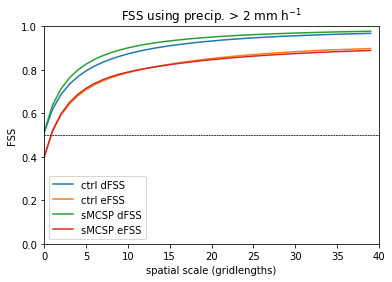

In [70]:
for expt in ['ctrl', 'sMCSP']:
    dFSS = expt_dFSS[expt]
    eFSS = expt_eFSS[expt]
    plt.plot(np.nanmean(dFSS, axis=(0, 1, 2)), label=f'{expt} dFSS')
    plt.plot(eFSS.mean(axis=(0, 1)), label=f'{expt} eFSS')
    plt.title('FSS using precip. > 2 mm h$^{-1}$')
    plt.xlabel('spatial scale (gridlengths)')
    plt.ylabel('FSS')
    plt.xlim((0, wmax))
    plt.ylim((0, 1))
    plt.axhline(y=0.5, c='k', ls='--', lw=0.5)
    plt.legend();

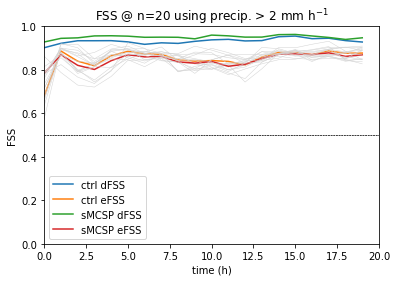

In [72]:
for expt in ['ctrl', 'sMCSP']:
    dFSS = expt_dFSS[expt]
    eFSS = expt_eFSS[expt]
    plt.plot(np.nanmean(dFSS[..., 20], axis=(0, 1)), label=f'{expt} dFSS')
    plt.plot(eFSS[..., 20].mean(axis=0), label=f'{expt} eFSS')
    plt.xlabel('time (h)')
    plt.ylabel('FSS')
    plt.title('FSS @ n=20 using precip. > 2 mm h$^{-1}$')
    plt.xlim((0, 20))
    plt.ylim((0, 1))
    plt.axhline(y=0.5, c='k', ls='--', lw=0.5)
    for i in range(8):
        plt.plot(eFSS[i, :, 20], c='lightgray', lw=0.5)
    plt.legend();

In [ ]:
raise Exception('Development/experimental code beyond this point')

In [10]:
# I have used a constrained layout to setup the figure. However, placing text 
# below the bottom of the fig messes up the layout for 0, 12 due to the placement
# of the LST text. This should fix things for anim:
# https://matplotlib.org/stable/users/explain/axes/constrainedlayout_guide.html#manually-turning-off-constrained-layout
# fig.set_layout_engine('none') # <- most recent matplotlib - I am using 3.5.1:
# https://matplotlib.org/3.5.3/tutorials/intermediate/constrainedlayout_guide.html#manually-turning-off-constrained-layout
fig.set_constrained_layout(False)


# pmax = max(pflux.values.max(), pflux0.values.max())
# Update function for the animation
def update(frame):
    print(frame)
    ax.cla()
    time = pd.Timestamp(pflux.time[frame].values.item())
    ax.set_title(f'N216 EM0 {time}')
    ax.coastlines()

    lst0, lst12 = calc_lon_lst0_lst12(time.hour)
    ax.axvline(x=lst0, c='k')
    ax.axvline(x=lst12, c='orange')
    ax.text(x=lst0, y=-100, s='0000 LST', ha='center')
    ax.text(x=lst12, y=-100, s='1200 LST', ha='center', c='orange')

    ax.contourf(pflux.longitude, pflux.latitude, pflux[frame] * 3600, levels=np.arange(13), cmap=cmap, extend='max')
    

# Create the animation object
ani = FuncAnimation(fig, update, frames=range(24))

# Display the animation in the notebook
# HTML(ani.to_jshtml())
HTML(ani.to_html5_video())

0
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23


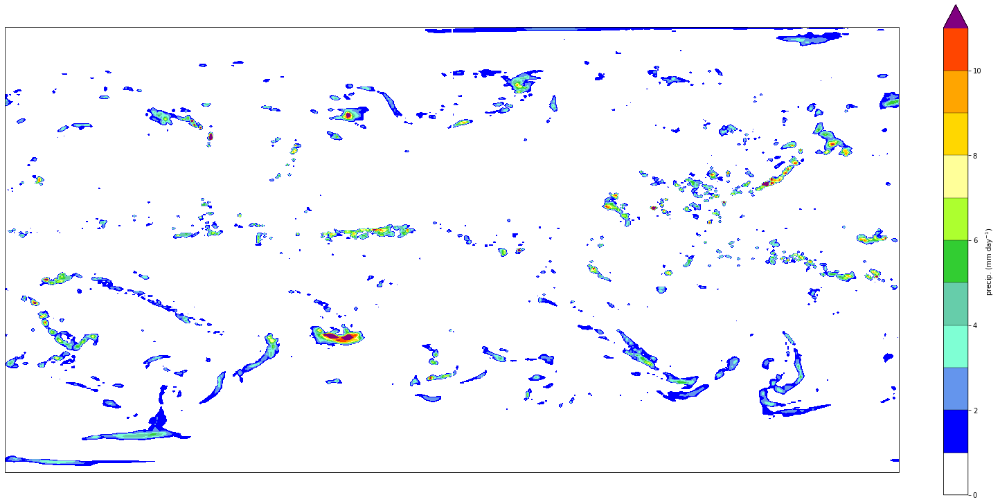

In [133]:
#%%capture
# Set up the figure, the axis, and the plot element we want to animate
fig, ax = plt.subplots(1, 1, subplot_kw={'projection': ccrs.PlateCarree()}, layout='constrained')
fig.set_size_inches(20, 10)

# colors = ['#800080', '#0000FF', '#6495ED', '#7FFFD4', '#66CDAA', '#32CD32', '#ADFF2F', '#FFFF99', '#FFD700', '#FFA500', '#FF4500', '#800080']
colors = ['#FFFFFF', '#0000FF', '#6495ED', '#7FFFD4', '#66CDAA', '#32CD32', '#ADFF2F', '#FFFF99', '#FFD700', '#FFA500', '#FF4500', '#800080']
# Create a custom colormap
cmap = mcolors.ListedColormap(colors[:-1])
cmap.set_over(colors[-1])
im = ax.contourf(pflux.longitude, pflux.latitude, pflux[0] * 3600, levels=np.arange(12), cmap=cmap, extend='max')
plt.colorbar(im, ax=ax, label='precip. (mm h$^{-1}$)', drawedges=True) 

In [9]:
%%script false --no-raise-error

# pmax = max(pflux.values.max(), pflux0.values.max())
# Update function for the animation
def update(frame):
    print(frame)
    ax.cla()
    time = pd.Timestamp(pflux.time[frame].values.item())
    ax.set_title(f'N216 EM0 {time}')
    ax.coastlines()
    ax.contourf(pflux.longitude, pflux.latitude, pflux[frame] * 3600, levels=np.arange(13), cmap=cmap, extend='max')
    

# Create the animation object
ani = FuncAnimation(fig, update, frames=range(12))

# Display the animation in the notebook
HTML(ani.to_jshtml())
# HTML(ani.to_html5_video())

In [10]:
# I have used a constrained layout to setup the figure. However, placing text 
# below the bottom of the fig messes up the layout for 0, 12 due to the placement
# of the LST text. This should fix things for anim:
# https://matplotlib.org/stable/users/explain/axes/constrainedlayout_guide.html#manually-turning-off-constrained-layout
# fig.set_layout_engine('none') # <- most recent matplotlib - I am using 3.5.1:
# https://matplotlib.org/3.5.3/tutorials/intermediate/constrainedlayout_guide.html#manually-turning-off-constrained-layout
fig.set_constrained_layout(False)
def calc_lon_lst0_lst12(h):
    lon_lst0 = -h * 15
    lon_lst12 = -(h - 12) * 15

    lon_lst0 = (lon_lst0 + 180) % 360 - 180
    lon_lst12 = (lon_lst12 + 180) % 360 - 180
    return lon_lst0, lon_lst12

# pmax = max(pflux.values.max(), pflux0.values.max())
# Update function for the animation
def update(frame):
    print(frame)
    ax.cla()
    time = pd.Timestamp(pflux.time[frame].values.item())
    ax.set_title(f'N216 EM0 {time}')
    ax.coastlines()

    lst0, lst12 = calc_lon_lst0_lst12(time.hour)
    ax.axvline(x=lst0, c='k')
    ax.axvline(x=lst12, c='orange')
    ax.text(x=lst0, y=-100, s='0000 LST', ha='center')
    ax.text(x=lst12, y=-100, s='1200 LST', ha='center', c='orange')

    ax.contourf(pflux.longitude, pflux.latitude, pflux[frame] * 3600, levels=np.arange(13), cmap=cmap, extend='max')
    

# Create the animation object
ani = FuncAnimation(fig, update, frames=range(24))

# Display the animation in the notebook
# HTML(ani.to_jshtml())
HTML(ani.to_html5_video())

0
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23


In [11]:
np.linspace(-180, 165, 24) + 15 / 2

array([-172.5, -157.5, -142.5, -127.5, -112.5,  -97.5,  -82.5,  -67.5,
        -52.5,  -37.5,  -22.5,   -7.5,    7.5,   22.5,   37.5,   52.5,
         67.5,   82.5,   97.5,  112.5,  127.5,  142.5,  157.5,  172.5])

In [12]:
t = pd.Timestamp(pflux.time_0[0].values.item())

AttributeError: 'DataArray' object has no attribute 'time_0'

In [ ]:
ts = np.arange(24)

In [ ]:
ts

In [ ]:
lon_ts0 = ts * 15 % 180
lon_ts0

In [ ]:
def calc_lon_ts0_ts12(h):
    lon_ts0 = -h * 15
    lon_ts12 = -(h - 12) * 15

    lon_ts0 = (lon_ts0 + 180) % 360 - 180
    lon_ts12 = (lon_ts12 + 180) % 360 - 180
    return lon_ts0, lon_ts12

for h in ts:
    print(h, calc_lon_ts0_ts12(h))

In [46]:
# Print the regridded precipitation rate data
# print("Regridded precipitation rate data:")
print(regridded_imerg)

<xarray.DataArray (time: 24, latitude: 324, longitude: 432)>
dask.array<_regrid, shape=(24, 324, 432), dtype=float32, chunksize=(1, 324, 432), chunktype=numpy.ndarray>
Coordinates:
  * time       (time) object 2020-07-01 00:00:00 ... 2020-07-01 23:00:00
  * longitude  (longitude) float32 0.4167 1.25 2.083 2.917 ... 357.9 358.7 359.6
  * latitude   (latitude) float32 -89.72 -89.17 -88.61 ... 88.61 89.17 89.72
Attributes:
    regrid_method:  bilinear


In [ ]:
fig, axes = plt.subplots(2, 1, subplot_kw={'projection': ccrs.PlateCarree()}, layout='constrained')
fig.set_size_inches(12, 12)

# colors = ['#800080', '#0000FF', '#6495ED', '#7FFFD4', '#66CDAA', '#32CD32', '#ADFF2F', '#FFFF99', '#FFD700', '#FFA500', '#FF4500', '#800080']
colors = ['#FFFFFF', '#0000FF', '#6495ED', '#7FFFD4', '#66CDAA', '#32CD32', '#ADFF2F', '#FFFF99', '#FFD700', '#FFA500', '#FF4500', '#800080']
# Create a custom colormap
cmap = mcolors.ListedColormap(colors)
im = axes[0].contourf(imerg_precip.lon, imerg_precip.lat, imerg_precip[0].values.T, levels=np.arange(13), cmap=cmap)
im = axes[1].contourf(regridded_imerg.longitude, regridded_imerg.latitude, regridded_imerg[0].values, levels=np.arange(13), cmap=cmap)
axes[0].coastlines()
axes[1].coastlines()
plt.colorbar(im, ax=axes) 

In [ ]:
def calc_fractions(a, n=1):
    f = np.zeros_like(a, dtype=float)
    idx0 = int((n - 1) / 2)
    idx = range(-idx0, idx0+1)
    for i in idx:
        for j in idx:
            f += np.roll(np.roll(a, i, axis=0), j, axis=1)
    return f / n**2
    
def calc_fss(a1, a2, n):
    o = calc_fractions(a1, n)
    m = calc_fractions(a2, n)
    mse_n = 1 / (a1.shape[0] * a1.shape[1]) * ((o - m)**2).sum()
    mse_ref = 1 / (a1.shape[0] * a1.shape[1]) * ((o**2).sum() + (m**2).sum())
    return 1 - mse_n / mse_ref

In [ ]:
((pflux[0] * 3600).values > 2).sum()

In [ ]:
(regridded_imerg[4].values > 2).sum()

In [ ]:
calc_fss((pflux[0] * 3600).values > 2, regridded_imerg[4].values > 2, 51)

In [ ]:
pflux.latitude.values[1] - pflux.latitude.values[0]

In [ ]:
51 * 0.5555

In [21]:
class EnsStatsCalculator:
    def demo(self):
        """Use this to understand algorithm"""
        a = np.array([
            [0, 0, 0, 1, 1, 1],
            [0, 0, 0, 0, 0, 1],
            [1, 0, 0, 0, 1, 1],
            [0, 1, 0, 0, 0, 0],
            [1, 0, 1, 0, 0, 0],
        ])
        max_w = 1
        max_n = 3
        print('a =')
        print(a)

        aa = self.zero_pad_array(a, max_w, max_n)
        print('aa =')
        print(aa)
        cuma = self.calc_cumulative_array(aa)
        print('cuma =')
        print(cuma)
        # Actual code loops over w values, with smart slicing of cuma.
        totals = self.calc_totals_array(cuma, max_n)
        print('totals =')
        print(totals)
                                 
        
    def zero_pad_array(self, a, max_w, max_n):
        """Build a new shape, sufficiently expanded so that it can handle the max neighbourhood size."""
        new_shape1 = tuple([*a.shape[:-2]] + [a.shape[-2] + max_n] + [a.shape[-1] + max_n])
        aa = np.zeros(new_shape1, dtype=a.dtype)
        # Copy input array into an expanded array. Presever all dims apart from last two.
        aa[..., max_n - max_w:-max_w, max_n - max_w:-max_w] = a
        return aa

    def calc_cumulative_array(self, aa):
        """Calculate a cumulative sum in both of last two dims."""
        return np.cumsum(np.cumsum(aa, axis=-1), axis=-2)
    
    def calc_totals_array(self, cuma, n):
        """Calculate the totals for one neighbourhood distance"""
        return cuma[..., n:, n:] - cuma[..., :-n, n:] - (cuma[..., n:, :-n] - cuma[..., :-n, :-n])

    def calc_totals_in_neighbourhoods(self, a, max_w):
        """Calculate the totals for all neighbourhoods from w=1 to max_w.
        
        Inputs:
        a: np.array, with final two dimensions the spatial dimensions.
        max_w: maximum neighbourhood size.
        Returns:
        totals: np.array, with same shape as a but extra dimension for w.
        
        Equivalent to stat.tot_filter in Seonaid's code.

        The algorithm for this is:
        * expand (zero pad) initial array so that I can do entire calc using slices.
        * calc a cumulitive array, cuma, that can be quickly used to calculate the number of 
          values in any given neihbourhood using four values.
        * loop over neighbourhood sizes:
          - from cuma, sliced appropriately, perform efficient calc of how many values are 
            in any given neighbourhood by calling calc_totals_array.

        What does this look like?
        Start with array:

        a = np.array([
            [0, 0, 0, 1, 1, 1],
            [0, 0, 0, 0, 0, 1],
            [1, 0, 0, 0, 1, 1],
            [0, 1, 0, 0, 0, 0],
            [1, 0, 1, 0, 0, 0],
        ])
        max_w = 1
        max_n = 3
        new_shape = (5 + 3, 6 + 3)
        aa = np.array([
            [0, 0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 1, 1, 1, 0],
            [0, 0, 0, 0, 0, 0, 0, 1, 0],
            [0, 0, 1, 0, 0, 0, 1, 1, 0],
            [0, 0, 0, 1, 0, 0, 0, 0, 0],
            [0, 0, 1, 0, 1, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 0, 0, 0, 0],
        ])
        cuma = np.array([
            [0, 0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 1, 2, 3, 3],
            [0, 0, 0, 0, 0, 1, 2, 4, 4],
            [0, 0, 1, 1, 1, 2, 4, 7, 7],
            [0, 0, 1, 2, 2, 3, 5, 8, 8],
            [0, 0, 2, 3, 4, 5, 7, 10, 10],
            [0, 0, 2, 3, 4, 5, 7, 10, 10],
        ])

        You can calculate the neighbourhood on any 3x3 sqaure in this as follows
        if the centre coord is i, j:
        v = (cuma[i + 1, j + 1] - cuma[i + 1, j - 2]) - (cuma[i - 2, j + 1] - cuma[i - 2, j - 2])
        You can convince yourself that this works by noting that the first bracketed term
        picks out a box that spans 3 columns, and contains the sum of the values in that area. Ditto the second
        bracketed term, but with 3 fewer rows. So subtracting the second from the first gives you the sum
        in the desired neighbourhood.
        """
        max_w = max_w
        max_n = max_w * 2 + 1
        aa = self.zero_pad_array(a, max_w, max_n)
        cuma = self.calc_cumulative_array(aa)

        ws = range(1, max_w + 1)
        new_shape2 = tuple([*a.shape, len(ws) + 1]) # +1 is for consistency with Seonaid, even though not used.
        totals = np.zeros(new_shape2)

        for i, w in enumerate(ws):
            n = w * 2 + 1
            margin = max_w - w
            if margin == 0:
                sliced_cuma = cuma
            else:
                sliced_cuma = cuma[..., margin:-margin, margin:-margin]
            totals[..., i] = self.calc_totals_array(sliced_cuma, n)
        return totals
    
    def calc_fracs_in_neighbourhoods(self, a, max_w):
        totals = self.calc_totals_in_neighbourhoods(a, max_w)
        ws = np.arange(1, max_w + 2)
        ns = 2 * ws + 1
        return totals / ws
    
    def calc_dFSS_m2m(self, a, max_w, mode='fast'):
        """Calculate the dFSS (dispersion fractional skill score) model to model
        
        i.e. between ensemble pairs.
        
        Inputs:
        a: np.array(nmem, ntime, nx, ny)
        max_w: maximum scale to use
        mode: 'fast' or 'orig'. Give identical results.
        
        Return:
        np.array(nmem, nmem, nx, ny, ntime)
        
        Algorithm:
        * calc neighbourhood totals
        * loop over time
        * loop over ensemble pairs 
        * for ens pair, find the first scale (w) where relationship is exceeded
        * record on 2d grid
        """
        # Constants taken straight from Seonaid's code.
        alpha = 0.5
        beta = 1 - alpha
        ws = np.arange(1, max_w + 2)
        # See dey2014spatial, eqn 5.
        rhs = alpha + beta / max_w * ws
        
        # Hardcoded dims hard to avoid?
        dims = np.shape(a)
        nummem = dims[0]  # number of members
        ntime = dims[1]  # number of times
        nx = dims[2]  # number of x points
        ny = dims[3]  # number of y points
        ess = np.zeros((nummem, nummem, nx, ny, ntime)) 
        
        totals = self.calc_totals_in_neighbourhoods(a, max_w)
        for i_time in range(ntime):
            # print(i_time)
            for i_mem1 in range(nummem - 1):
                for i_mem2 in range(i_mem1, nummem):
                    d1 = totals[i_mem1, i_time, ...]
                    d2 = totals[i_mem2, i_time, ...]
                    with np.errstate(divide='ignore', invalid='ignore'):
                        # These are fixed in next line.
                        lhs = (d1 - d2)**2 / (d1**2 + d2**2)
                    lhs[(d1 <= 0) & (d2 <= 0)] = 10
                    if mode == 'fast':
                        # Avoids any slow python loops.
                        exceedance3d = lhs / rhs[None, None, :] < 1
                        # Trick to get first value along axis=-1 where condition is true.
                        # https://stackoverflow.com/a/54155879/54557
                        idx = np.where((exceedance3d.cumsum(axis=-1).cumsum(axis=-1) == 1))
                        # Build 2d array to store values
                        exceedance2d = np.zeros(exceedance3d.shape[:2])
                        # Use the first two pairs of values in idx[:2] to set array
                        # Set with third value in idx[2], which is the index of the first 
                        # exceedance cell.
                        exceedance2d[idx[:2]] = idx[2] + 1  # consistency with Seonaid's code
                        # Any zerod values should be set to max_w.
                        exceedance2d[exceedance2d == 0] = max_w
                        ess[i_mem1, i_mem2, :, :, i_time] = exceedance2d
                    elif mode == 'orig':
                        # As Seonaid's original code.
                        for i_x in range(0, nx, 1):  # loop over grid points
                            for i_y in range(0, ny, 1):  # find minimum scale at which criterion is met
                                w = 1
                                exceeded = 0
                                while exceeded == 0:
                                    if (
                                        lhs[i_x, i_y, w - 1] / rhs[w - 1] < 1
                                    ):  # THIS SHOULD BE A <= (THOUGH CHANGING THIS WON'T HAVE ANY NOTICIBLE EFFECT)
                                        ess[i_mem1, i_mem2, i_x, i_y, i_time] = w
                                        exceeded = 1
                                    elif (
                                        w >= max_w
                                    ):  # THIS IS ONLY NEEDED BECAUSE THE <= IS A < (LHS=RHS BY DEFINITION AT LMAX, SO IF USE <= DON'T NEED THIS STEP)
                                        exceeded = 1
                                        ess[i_mem1, i_mem2, i_x, i_y, i_time] = max_w
                                    else:
                                        w = w + 1
                             
        return ess
    
    def calc_FSS_m2m_mean(self, dFFS, nummem):
        mem_indarr = list(range(0, nummem, 1))
        dims = np.shape(dFFS)
        nummem = dims[0]
        nx = dims[2]
        ny = dims[3]
        ntimes = dims[4]
        dat_tomean = np.empty((nummem, nummem - 1, nx, ny, ntimes))
        for i_ref in range(0, nummem, 1):
            println('Using reference member: ', i_ref)
            up_arr = mem_indarr[i_ref + 1 :]  # array for all members above reference
            down_arr = mem_indarr[:i_ref]  # array for all members below reference
            println('uparr: ', up_arr)
            println('downarr: ', down_arr)
            dat_tomean[i_ref, 0 : len(up_arr), :, :, :] = dFSS[i_ref, up_arr, :, :, :]
            dat_tomean[i_ref, len(up_arr) :, :, :, :] = dFSS[down_arr, i_ref, :, :, :]
            println(np.shape(dat_tomean))
        dat_mean = np.mean(dat_tomean, axis=1)
        #  dat_mean=np.nansum(dat_tomean,axis=1)

        #    print 'shape of dat_mean: ', np.shape(dat_mean)
        return dat_mean
    
    def calc_FSS(self, a1, a2, max_w):
        max_n = max_w * 2 + 1
        f1 = self.calc_fracs_in_neighbourhoods(a1, max_w)
        f2 = self.calc_fracs_in_neighbourhoods(a2, max_w)
        return 1 - np.nansum(((f1 - f2)**2), axis=(1, 2)) / np.nansum((f1**2 + f2**2), axis=(1, 2))


      

In [22]:
calc = EnsStatsCalculator()

In [47]:
pflux_tropics = pflux.isel(latitude=slice(108, 216), time=slice(0, 20))
pflux_tropics.latitude
imerg_tropics = regridded_imerg.isel(latitude=slice(108, 216), time=slice(4, 24))

In [48]:
pflux_tropics

<xarray.DataArray 'precipitation_flux' (time: 20, latitude: 108, longitude: 432)>
array([[[8.620756e-06, 5.932953e-08, ..., 1.304093e-08, 1.568292e-07],
        [4.633012e-08, 8.149552e-07, ..., 6.387412e-06, 7.457524e-06],
        ...,
        [0.000000e+00, 0.000000e+00, ..., 0.000000e+00, 0.000000e+00],
        [0.000000e+00, 0.000000e+00, ..., 0.000000e+00, 0.000000e+00]],

       [[1.050122e-05, 1.982586e-07, ..., 1.632423e-06, 3.573457e-11],
        [5.007311e-06, 2.894128e-06, ..., 7.603334e-08, 9.906071e-06],
        ...,
        [0.000000e+00, 0.000000e+00, ..., 0.000000e+00, 1.887620e-08],
        [0.000000e+00, 0.000000e+00, ..., 0.000000e+00, 0.000000e+00]],

       ...,

       [[1.016707e-05, 1.359003e-06, ..., 9.064018e-05, 2.537550e-08],
        [2.314164e-06, 3.140428e-06, ..., 3.208861e-06, 7.425094e-09],
        ...,
        [0.000000e+00, 0.000000e+00, ..., 0.000000e+00, 1.795602e-08],
        [0.000000e+00, 0.000000e+00, ..., 0.000000e+00, 0.000000e+00]],

       [[1.146891e-07, 1.215586e-07, ..., 8.662363e-05, 8.729742e-06],
        [4.237753e-07, 4.949810e-06, ..., 5.358509e-08, 1.890278e-09],
        ...,
        [0.000000e+00, 0.000000e+00, ..., 0.000000e+00, 0.000000e+00],
        [0.000000e+00, 0.000000e+00, ..., 0.000000e+00, 0.000000e+00]]],
      dtype=float32)
Coordinates:
  * latitude                   (latitude) float32 -29.72 -29.17 ... 29.17 29.72
  * longitude                  (longitude) float32 0.4167 1.25 ... 358.7 359.6
  * time                       (time) datetime64[ns] 2020-07-01T04:00:00 ... ...
    forecast_period_0          (time) timedelta64[ns] 04:00:00 ... 17:00:00
    forecast_reference_time_0  (time) datetime64[ns] 2020-07-01 ... 2020-07-0...
    height                     float64 1.5
    forecast_period_2          timedelta64[ns] 03:00:00
    forecast_reference_time_1  datetime64[ns] 2020-07-01
    time_2                     datetime64[ns] 2020-07-01T03:00:00
    height_0                   float32 8e+03
    height_1                   float64 10.0
Attributes:
    standard_name:    precipitation_flux
    units:            kg m-2 s-1
    um_stash_source:  m01s05i216
    grid_mapping:     latitude_longitude

In [49]:
imerg_tropics

<xarray.DataArray (time: 20, latitude: 108, longitude: 432)>
dask.array<getitem, shape=(20, 108, 432), dtype=float32, chunksize=(1, 108, 432), chunktype=numpy.ndarray>
Coordinates:
  * time       (time) object 2020-07-01 04:00:00 ... 2020-07-01 23:00:00
  * longitude  (longitude) float32 0.4167 1.25 2.083 2.917 ... 357.9 358.7 359.6
  * latitude   (latitude) float32 -29.72 -29.17 -28.61 ... 28.61 29.17 29.72
Attributes:
    regrid_method:  bilinear

In [74]:
pflux_ptile = np.percentile((pflux_tropics.values * 3600), 99)
imerg_ptile = np.percentile((imerg_tropics.values), 99)
print(pflux_ptile, imerg_ptile)
pflux_ptile = 2
imerg_ptile = 2
fss = calc.calc_FSS((pflux_tropics.values * 3600) > pflux_ptile, imerg_tropics.values > imerg_ptile, 80)

7.103978633880606 3.258297367095935


/tmp/ipykernel_626/3967188769.py:240: RuntimeWarning: invalid value encountered in true_divide
  return 1 - np.nansum(((f1 - f2)**2), axis=(1, 2)) / np.nansum((f1**2 + f2**2), axis=(1, 2))


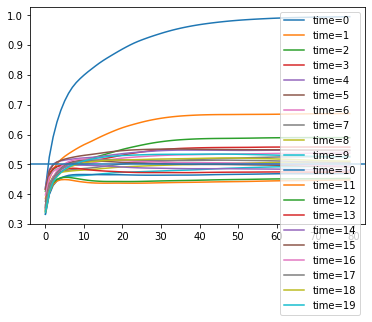

In [75]:
for itime in range(20):
    plt.plot(fss[itime], label=f'time={itime}')
plt.legend()
plt.axhline(y=0.5)

In [76]:
def plot_pflux_imerg(tidx):
    fig, axes = plt.subplots(2, 1, subplot_kw={'projection': ccrs.PlateCarree()})
    fig.set_size_inches(20, 5)
    for ppt, ax, ptile in zip([pflux_tropics * 3600, imerg_tropics], axes, [pflux_ptile, imerg_ptile]):
        ax.coastlines()
        im = ax.contourf(ppt.longitude, ppt.latitude, (ppt[tidx] > ptile) * 5, levels=np.arange(13), cmap=cmap, extend='max')
    
    plt.colorbar(im, ax=axes)
    


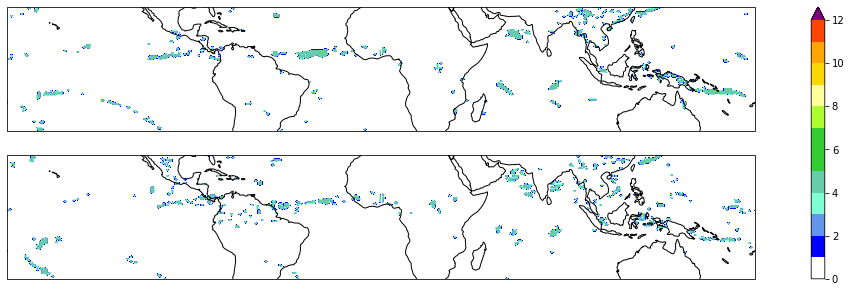

In [77]:
plot_pflux_imerg(0)

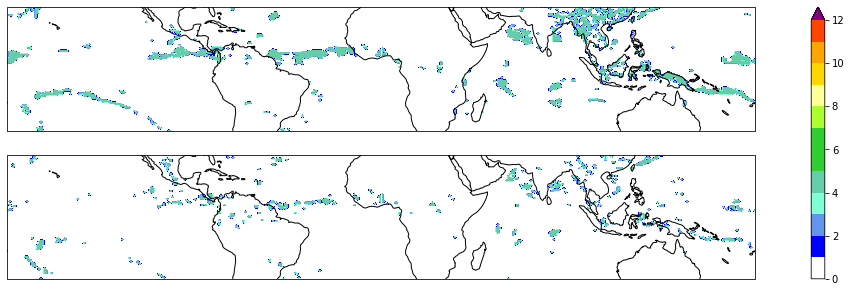

In [78]:
plot_pflux_imerg(1)

In [91]:
%%capture
# Set up the figure, the axis, and the plot element we want to animate
fig, axes = plt.subplots(2, 1, subplot_kw={'projection': ccrs.PlateCarree()}, layout='constrained')
fig.set_size_inches(15, 8)
axes[0].set_ylim([-30, 30])
axes[1].set_ylim([-30, 30])

# colors = ['#800080', '#0000FF', '#6495ED', '#7FFFD4', '#66CDAA', '#32CD32', '#ADFF2F', '#FFFF99', '#FFD700', '#FFA500', '#FF4500', '#800080']
colors = ['#FFFFFF', '#0000FF', '#6495ED', '#7FFFD4', '#66CDAA', '#32CD32', '#ADFF2F', '#FFFF99', '#FFD700', '#FFA500', '#FF4500', '#800080']
# Create a custom colormap
cmap = mcolors.ListedColormap(colors)
im = axes[0].contourf(pflux_tropics.longitude, pflux_tropics.latitude, pflux_tropics[0] * 3600, levels=np.arange(13), cmap=cmap)
plt.colorbar(im, ax=axes) 

In [93]:
# I have used a constrained layout to setup the figure. However, placing text 
# below the bottom of the fig messes up the layout for 0, 12 due to the placement
# of the LST text. This should fix things for anim:
# https://matplotlib.org/stable/users/explain/axes/constrainedlayout_guide.html#manually-turning-off-constrained-layout
# fig.set_layout_engine('none') # <- most recent matplotlib - I am using 3.5.1:
# https://matplotlib.org/3.5.3/tutorials/intermediate/constrainedlayout_guide.html#manually-turning-off-constrained-layout
fig.set_constrained_layout(False)
def calc_lon_lst0_lst12(h):
    lon_lst0 = -h * 15
    lon_lst12 = -(h - 12) * 15

    lon_lst0 = (lon_lst0 + 180) % 360 - 180
    lon_lst12 = (lon_lst12 + 180) % 360 - 180
    return lon_lst0, lon_lst12

# pmax = max(pflux.values.max(), pflux0.values.max())
# Update function for the animation
def update(frame):
    print(frame)
    time = pd.Timestamp(pflux_tropics.time[frame].values.item())

    ax = axes[0]
    ax.cla()

    ax.set_title(f'N216 EM0 {time}')
    ax.coastlines()

    lst0, lst12 = calc_lon_lst0_lst12(time.hour)
    ax.axvline(x=lst0, c='k')
    ax.axvline(x=lst12, c='orange')
    ax.text(x=lst0, y=-100, s='0000 LST', ha='center')
    ax.text(x=lst12, y=-100, s='1200 LST', ha='center', c='orange')

    ax.contourf(pflux_tropics.longitude, pflux_tropics.latitude, pflux_tropics[frame] * 3600, levels=np.arange(13), cmap=cmap, extend='max')
    #ax.set_extent([-180, 179, -30, 30])
    ax.set_ylim([-30, 30])
    
    ax = axes[1]
    ax.cla()
    ax.set_title(f'IMERG {time}')
    ax.coastlines()
    
    lst0, lst12 = calc_lon_lst0_lst12(time.hour)
    ax.axvline(x=lst0, c='k')
    ax.axvline(x=lst12, c='orange')
    ax.text(x=lst0, y=-100, s='0000 LST', ha='center')
    ax.text(x=lst12, y=-100, s='1200 LST', ha='center', c='orange')

    ax.contourf(imerg_tropics.longitude, imerg_tropics.latitude, imerg_tropics[frame], levels=np.arange(13), cmap=cmap, extend='max')
    ax.set_ylim([-30, 30])
    

# Create the animation object
ani = FuncAnimation(fig, update, frames=range(20))

# Display the animation in the notebook
# HTML(ani.to_jshtml())
HTML(ani.to_html5_video())

0
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19


In [136]:
fss_e2e = np.full((8, 8, 20, 80), np.nan)
for i in range(8):
    for j in range(i + 1, 8):
        print(i, j)
        pflux1 = ens[f'em{i}']
        pflux2 = ens[f'em{j}']
        fss = calc.calc_FSS((pflux1.values * 3600) > pflux_ptile, (pflux2.values * 3600) > pflux_ptile, 80)
        fss_e2e[i, j] = fss[..., :-1]


0 1


/tmp/ipykernel_626/3967188769.py:240: RuntimeWarning: invalid value encountered in true_divide
  return 1 - np.nansum(((f1 - f2)**2), axis=(1, 2)) / np.nansum((f1**2 + f2**2), axis=(1, 2))


0 2
0 3
0 4
0 5
0 6
0 7
1 2
1 3
1 4
1 5
1 6
1 7
2 3
2 4
2 5
2 6
2 7
3 4
3 5
3 6
3 7
4 5
4 6
4 7
5 6
5 7
6 7


In [137]:
fss_e2e.sum(axis=(2, 3))

array([[          nan, 1532.36831051, 1544.48760334, 1525.99065334,
        1538.52058328, 1526.29151746, 1532.8883459 , 1539.44368002],
       [          nan,           nan, 1508.37365879, 1499.33258858,
        1510.30079692, 1506.43555194, 1502.45241813, 1515.12485782],
       [          nan,           nan,           nan, 1518.85610883,
        1514.04478444, 1509.85994465, 1509.0918591 , 1520.23456751],
       [          nan,           nan,           nan,           nan,
        1501.96915386, 1500.02132308, 1502.51349874, 1507.59978308],
       [          nan,           nan,           nan,           nan,
                  nan, 1513.06953739, 1503.36874006, 1512.36578165],
       [          nan,           nan,           nan,           nan,
                  nan,           nan, 1508.61868232, 1515.80906949],
       [          nan,           nan,           nan,           nan,
                  nan,           nan,           nan, 1514.17244668],
       [          nan,           nan,    

In [138]:
fss_e2e.shape

(8, 8, 20, 80)

In [139]:
np.nanmean(fss_e2e, axis=(0, 1, 2))

array([0.51622019, 0.63810002, 0.71206847, 0.76244586, 0.79881707,
       0.82627703, 0.84785972, 0.86521372, 0.87939235, 0.89112662,
       0.90099694, 0.90942827, 0.91664781, 0.9228703 , 0.92830471,
       0.93308687, 0.9373468 , 0.94117492, 0.94464927, 0.94782769,
       0.95073089, 0.95337721, 0.9557951 , 0.95800272, 0.96000837,
       0.96183603, 0.96351838, 0.96508362, 0.96654685, 0.96791937,
       0.96921019, 0.97042041, 0.9715511 , 0.97261108, 0.973599  ,
       0.97451417, 0.97536095, 0.97614655, 0.9768813 , 0.97757057,
       0.97821824, 0.97882815, 0.979398  , 0.97993403, 0.98044451,
       0.98093417, 0.98140571, 0.98185695, 0.98228902, 0.98270299,
       0.98310027, 0.98348203, 0.9838495 , 0.98420069, 0.98453497,
       0.98485373, 0.98515782, 0.98544877, 0.98572959, 0.98599579,
       0.98624597, 0.98648335, 0.98670589, 0.98691711, 0.98712381,
       0.98732762, 0.98752846, 0.98772399, 0.98791273, 0.98809186,
       0.98826479, 0.98843101, 0.98859188, 0.98874543, 0.98889

In [140]:
fss_e2o = np.zeros((8, 20, 80))
for i in range(8):
    print(i)
    pflux1 = ens[f'em{i}']
    fss = calc.calc_FSS((pflux1.values * 3600) > pflux_ptile, imerg_tropics.values > pflux_ptile, 80)
    fss_e2o[i] = fss[..., :-1]

0


/tmp/ipykernel_626/3967188769.py:240: RuntimeWarning: invalid value encountered in true_divide
  return 1 - np.nansum(((f1 - f2)**2), axis=(1, 2)) / np.nansum((f1**2 + f2**2), axis=(1, 2))


1
2
3
4
5
6
7


In [141]:
fss_e2o.sum(axis=(1, 2))

array([1353.72910034, 1387.8844971 , 1347.66178574, 1355.12791146,
       1384.5951479 , 1365.77354935, 1373.62690144, 1374.0780066 ])

In [142]:
fss_e2o.mean(axis=(0, 1))

array([0.39845803, 0.52133046, 0.59698143, 0.64901042, 0.68662824,
       0.71503918, 0.7372189 , 0.75475495, 0.7687997 , 0.78029329,
       0.7899116 , 0.79815993, 0.80547412, 0.81208977, 0.8181264 ,
       0.82372582, 0.82895391, 0.83384224, 0.83844996, 0.84276476,
       0.84676682, 0.85047504, 0.85391243, 0.85712028, 0.8601214 ,
       0.8629378 , 0.86558407, 0.86810575, 0.87047711, 0.87271863,
       0.87482775, 0.87680884, 0.87868165, 0.88045813, 0.8821143 ,
       0.88364889, 0.88507203, 0.88642393, 0.88775742, 0.88908852,
       0.89039051, 0.89163802, 0.89281973, 0.89393287, 0.89497514,
       0.89595574, 0.89687681, 0.89773444, 0.89854275, 0.89930758,
       0.90004134, 0.90074987, 0.90144157, 0.90211153, 0.90276155,
       0.9033925 , 0.90399941, 0.90457967, 0.90512942, 0.90564923,
       0.90612385, 0.90655949, 0.90695427, 0.90730587, 0.90762404,
       0.90791495, 0.90816497, 0.90838677, 0.90860154, 0.90882545,
       0.90904937, 0.90925495, 0.90943978, 0.90961824, 0.90979

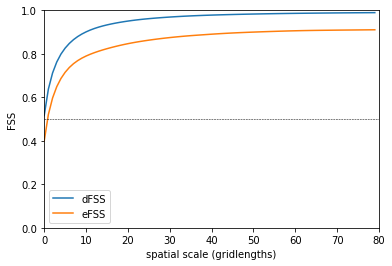

In [143]:
plt.plot(np.nanmean(fss_e2e, axis=(0, 1, 2)), label='dFSS')
plt.plot(fss_e2o.mean(axis=(0, 1)), label='eFSS')
plt.xlabel('spatial scale (gridlengths)')
plt.ylabel('FSS')
plt.xlim((0, 80))
plt.ylim((0, 1))
plt.axhline(y=0.5, c='k', ls='--', lw=0.5)
plt.legend();

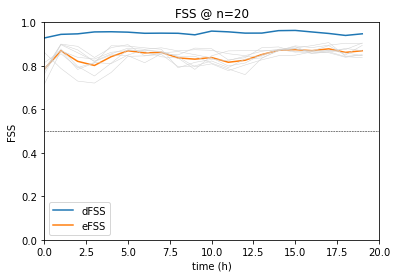

In [144]:
plt.plot(np.nanmean(fss_e2e[..., 20], axis=(0, 1)), label='dFSS')
plt.plot(fss_e2o[..., 20].mean(axis=0), label='eFSS')
plt.xlabel('time (h)')
plt.ylabel('FSS')
plt.title('FSS @ n=20')
plt.xlim((0, 20))
plt.ylim((0, 1))
plt.axhline(y=0.5, c='k', ls='--', lw=0.5)
for i in range(8):
    plt.plot(fss_e2o[i, :, 20], c='lightgray', lw=0.5)
plt.legend();